# Introduction of the business problem

## PROBLEM STATEMENT

The FMCG company is facing an issue with the mismatch between demand and supply for their instant noodles across various warehouses in the country. This imbalance is resulting in both excess inventory in some areas and stockouts in others, leading to significant inventory cost losses. The company seeks to optimize the supply chain by determining the ideal quantity of product to ship to each warehouse based on historical demand data. Furthermore, the company wants to analyze regional demand patterns to refine its advertising campaigns and target specific pockets of the country where demand is high but supply is low.

## Need of the Study/Project

The study aims to develop a data-driven model that:

* Optimizes the Supply Chain: The key objective is to accurately predict the optimal quantity of product to be shipped to each warehouse, minimizing both understocking and overstocking scenarios. By doing so, the company will reduce its inventory costs and enhance overall operational efficiency.

* Improves Demand Forecasting: The study will also involve analyzing demand patterns across different regions of the country. This will allow the company to understand which areas experience higher demand for instant noodles and at what times, helping to guide better supply decisions.

* Refines Marketing Strategy: Based on the demand analysis, the company can optimize its advertisement strategy, ensuring it focuses efforts on regions with the highest potential for growth. Targeting specific pockets of high demand can result in higher sales and improved brand recognition in those areas.

* Provides Actionable Insights for Phase 2: The initial success of the model using limited data will serve as a proof of concept, paving the way for access to a more comprehensive data lake in the future, which can be used to develop a more sophisticated and robust supply chain optimization model.



## Understanding business/social opportunity

###### 1.Business Opportunity:

    * Cost Reduction: Efficient supply chain management can lead to significant cost savings. By minimizing excess inventory and avoiding stockouts, the company can optimize storage costs, transportation costs, and reduce wastage.
    
    * Revenue Maximization: A more accurate supply system ensures products are available where and when they are needed, thus increasing sales opportunities and customer satisfaction. By analyzing regional demand, the company can also tailor marketing efforts to boost sales in high-demand areas.
    
    * Competitive Advantage: The company can gain an edge over competitors by efficiently managing its supply chain, ensuring they are more responsive to market conditions and consumer demands.


###### 2.Social Opportunity:

    * Increased Product Accessibility: By optimizing supply, the company ensures that their products are available to consumers where they are needed most, improving accessibility in both urban and rural areas.
    
    * Economic Growth: Efficient supply chains contribute to the overall economic development of local areas by enabling more consistent availability of goods. This can indirectly support regional economic stability and employment.
    
    * Sustainability: By minimizing wastage through optimized supply, the company can take a more sustainable approach to inventory management, which can improve its brand image and align with global environmental goals.

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#### Importing the dataset

In [2]:
df = pd.read_csv("C:/Users/AKHIL MOHANDAS/Desktop/CAPSTONE_Project/Data.csv")

### Data Report

#### Visual inspection of data

In [3]:
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,1,112,25.0,2009.0,18,0,C,6,24,24071


In [4]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 25000 
The number of columns (variables) is 24


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                25000 non-null  int64  
 13  f

In [6]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ware_house_ID,25000,25000,WH_100000,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WH_Manager_ID,25000,25000,EID_50000,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location_type,25000,2,Rural,22957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WH_capacity_size,25000,3,Large,10169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
zone,25000,4,North,10278,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WH_regional_zone,25000,6,Zone 6,8339,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_refill_req_l3m,25000.0,NaN,NaN,NaN,4.08904,2.606612,0.0,2.0,4.0,6.0,8.0
transport_issue_l1y,25000.0,NaN,NaN,NaN,0.77368,1.199449,0.0,0.0,0.0,1.0,5.0
Competitor_in_mkt,25000.0,NaN,NaN,NaN,3.1042,1.141663,0.0,2.0,3.0,4.0,12.0
retail_shop_num,25000.0,NaN,NaN,NaN,4985.71156,1052.825252,1821.0,4313.0,4859.0,5500.0,11008.0


In [7]:
df.rename(columns={
    "Ware_house_ID": "Warehouse_ID",
    "WH_Manager_ID": "Warehouse_Manager_ID",
    "wh_owner_type": "Warehouse_Ownership",
    "product_wg_ton": "Product_Shipped_Tons"
}, inplace=True)

###### Inference

Most columns have complete data, but three columns have missing values:
        
       * workers_num: 990 missing values.
   
       * wh_est_year: 11,881 missing values.
   
       * approved_wh_govt_certificate: 908 missing values.
   
   
* The "wh_est_year" column has significant missing data, which might affect analysis on older vs. newer warehouses.
 

* "workers_num" and "approved_wh_govt_certificate" have relatively fewer missing values and can be imputed.

###### Distribution and Trends

* Warehouse Locations and Capacities:
 
    * Most warehouses are in rural areas.
    * Warehouses are mostly Large followed by medium and small.
    * The highest number of warehouses are in the North zone.

* Retail Shop and Distributor Network:
 
    * Average number of retail shops served per warehouse: 4,986.
    * Number of distributors per warehouse: 42.
    * On average, 3 competitors per region, but some areas have up to 12 competitors. 
    * Some warehouses serve up to 11,008 retail shops, indicating high demand while the lowest value is 1821.

* Logistics and Infrastructure:
 
    * Average distance between warehouse to the production hub in Kms: 164 km, with some warehouses as far as 271 km.
    * Warehouses farther from hubs might face transport delays and inventory shortages.
    * Warehouses faced an average of 3.48 breakdowns in 3 months.
    * Warehouses were inspected an average of 18.8 times in 3 months, ensuring regulatory compliance.
    

* Demand-Supply Mismatch Insights:
 
    * Some warehouses required up to 8 refills in the last 3 months, while others needed none.
    * This suggests uneven demand, leading to overstocking in some areas and shortages in others.
    * Average: 22,102 tons, with a range from 2,065 to 55,151 tons.
    * A large variation in shipped weight suggests inefficiencies in supply allocation.
        




* Flood and Electrical Resilience:
 
    * 9.8% of warehouses are in flood-prone areas, but only 5.5% are flood-proof.
    * Only 65.7% of warehouses have electric backup, meaning that 34.3% may face operational delays during power cuts.

In [8]:
df.columns

Index(['Warehouse_ID', 'Warehouse_Manager_ID', 'Location_type',
       'WH_capacity_size', 'zone', 'WH_regional_zone', 'num_refill_req_l3m',
       'transport_issue_l1y', 'Competitor_in_mkt', 'retail_shop_num',
       'Warehouse_Ownership', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'Product_Shipped_Tons'],
      dtype='object')

### Univariate analysis

###### Numerical Values

In [9]:
num = df.select_dtypes(include=['int64', 'float64']).columns #Numerical_columns

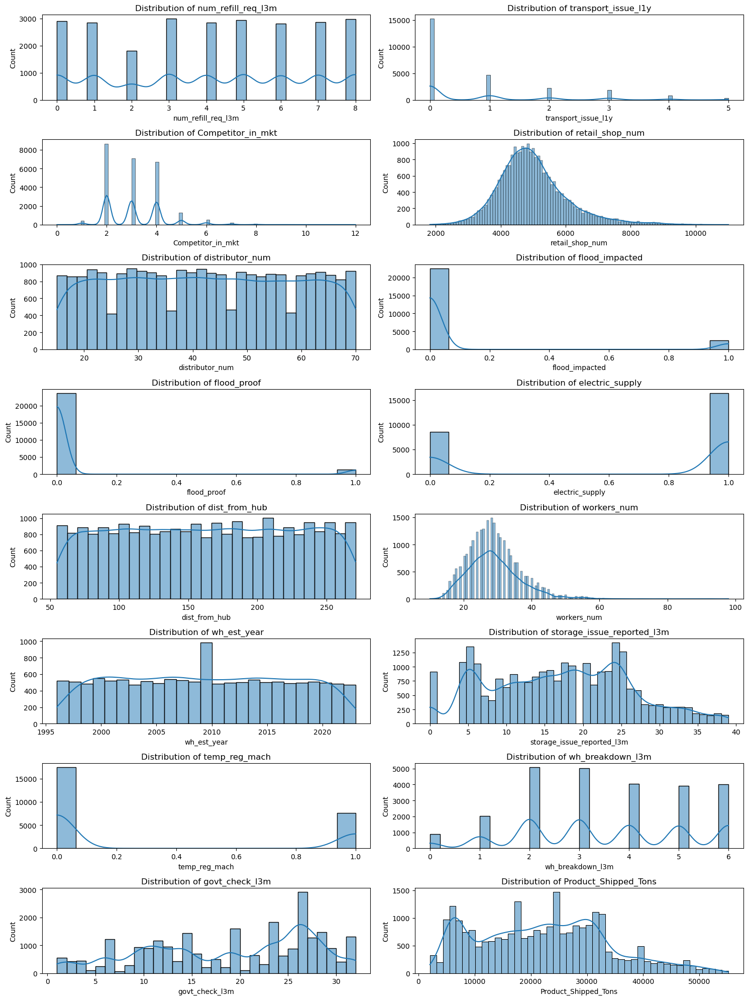

In [10]:
plt.figure(figsize=(15, 20))

for i, col in enumerate(num, 1):
    plt.subplot(8, 2, i)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

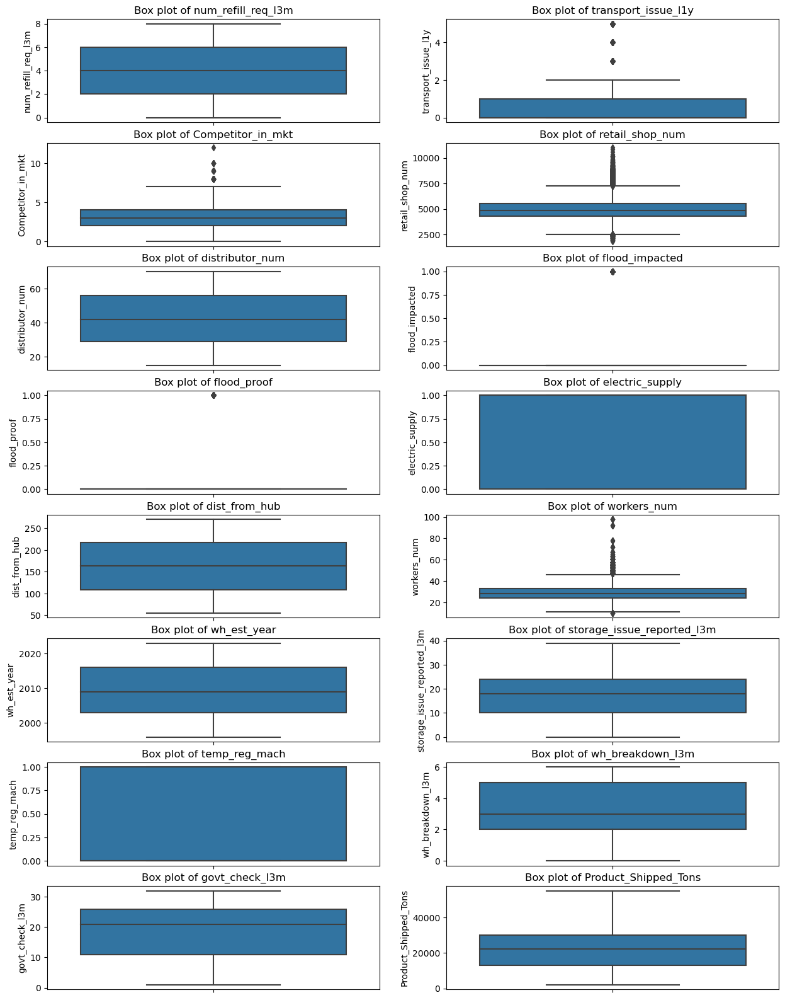

In [11]:
plt.figure(figsize=(15, 20))

for i, col in enumerate(num, 1):
    plt.subplot(8, 2, i)
    sns.boxplot(y=df[col])
    plt.title(f'Box plot of {col}')


plt.show()

In [12]:
df[num].describe().T

,count,mean,std,min,25%,50%,75%,max
num_refill_req_l3m,25000.0,4.089040,2.606612,0.0,2.0,4.0,6.0,8.0
transport_issue_l1y,25000.0,0.773680,1.199449,0.0,0.0,0.0,1.0,5.0
Competitor_in_mkt,25000.0,3.104200,1.141663,0.0,2.0,3.0,4.0,12.0
retail_shop_num,25000.0,4985.711560,1052.825252,1821.0,4313.0,4859.0,5500.0,11008.0
distributor_num,25000.0,42.418120,16.064329,15.0,29.0,42.0,56.0,70.0
flood_impacted,25000.0,0.098160,0.297537,0.0,0.0,0.0,0.0,1.0
flood_proof,25000.0,0.054640,0.227281,0.0,0.0,0.0,0.0,1.0
electric_supply,25000.0,0.656880,0.474761,0.0,0.0,1.0,1.0,1.0
dist_from_hub,25000.0,163.537320,62.718609,55.0,109.0,164.0,218.0,271.0
workers_num,24010.0,28.944398,7.872534,10.0,24.0,28.0,33.0,98.0


* Most warehouses are not flood-proof and are not impacted by floods.
* Most warehouses have zero transport issues, but some report frequent problems.
* Very few warehouses have Temperature Regulation Machines.
* during the year 2009-10 most number of warehouses are established.
* Since only 5.5% are flood-proof, targeted infrastructure improvements are needed.
* Outliers are present for few variables.

###### Categorical Values

In [13]:
cat = df.select_dtypes(include=['object']).columns #Categorical Variables

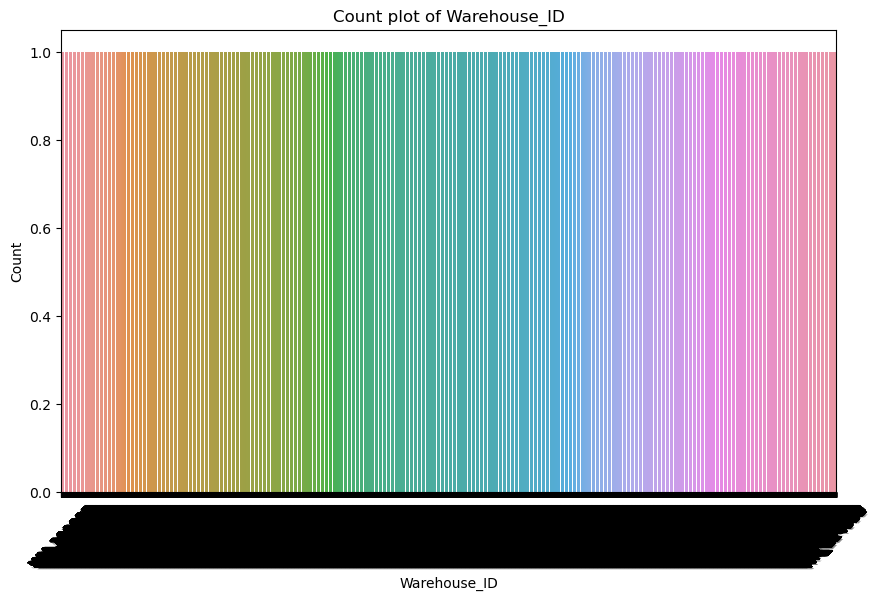

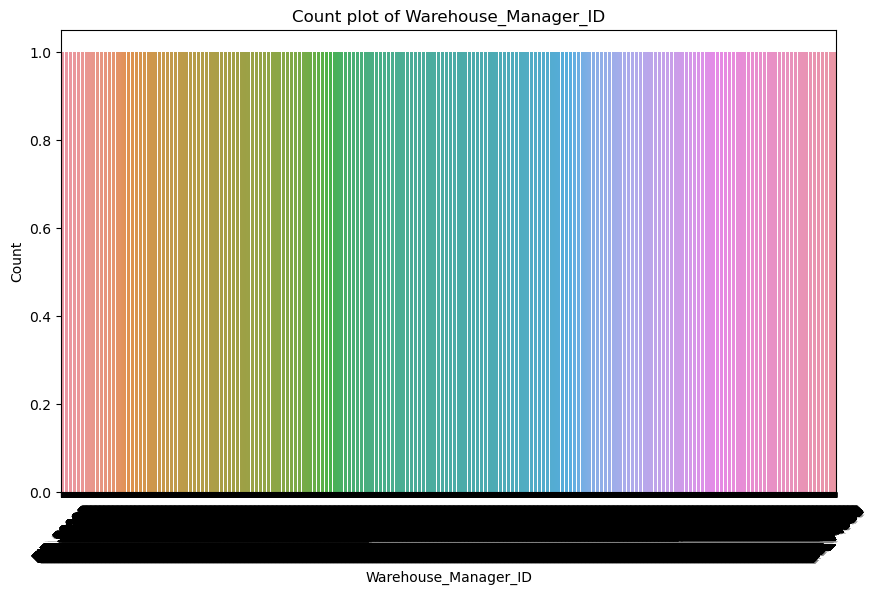

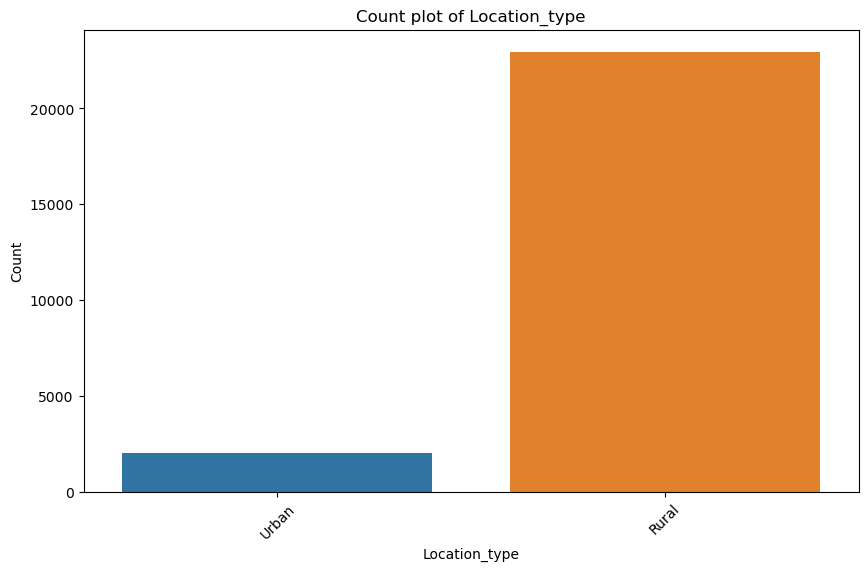

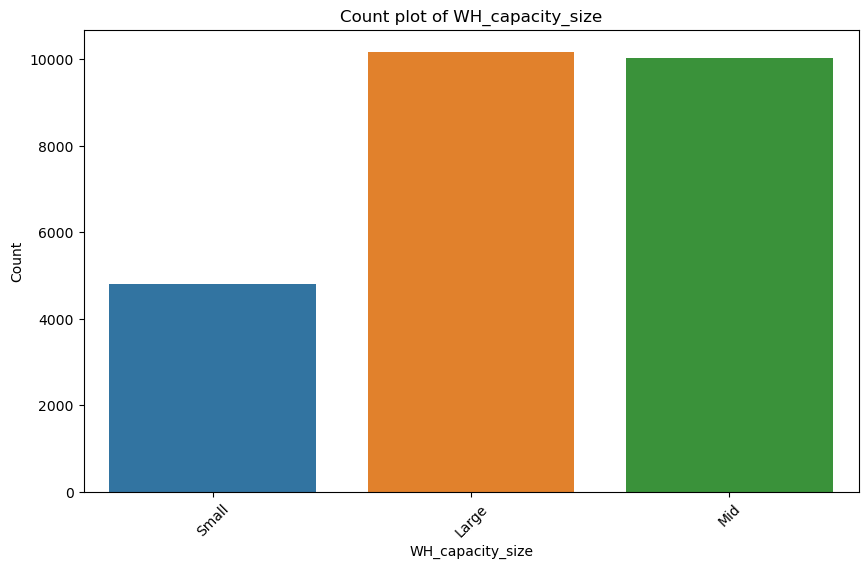

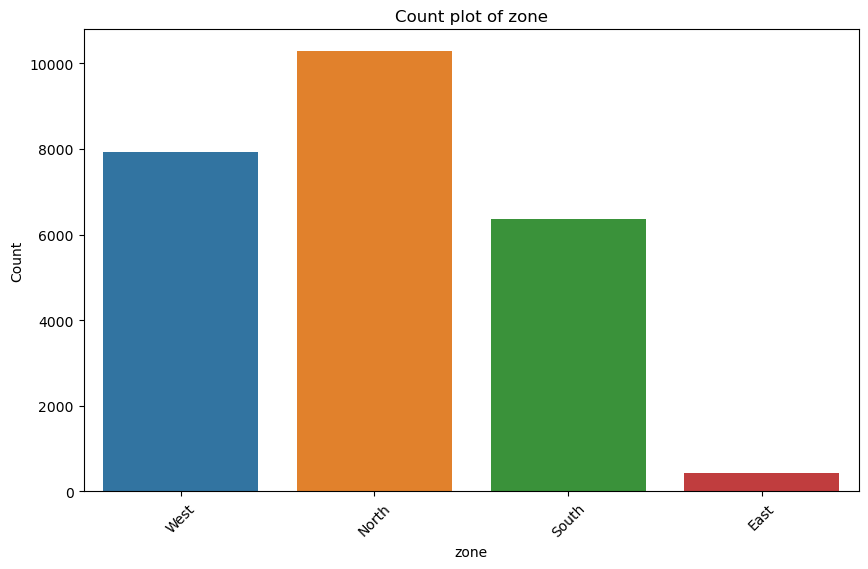

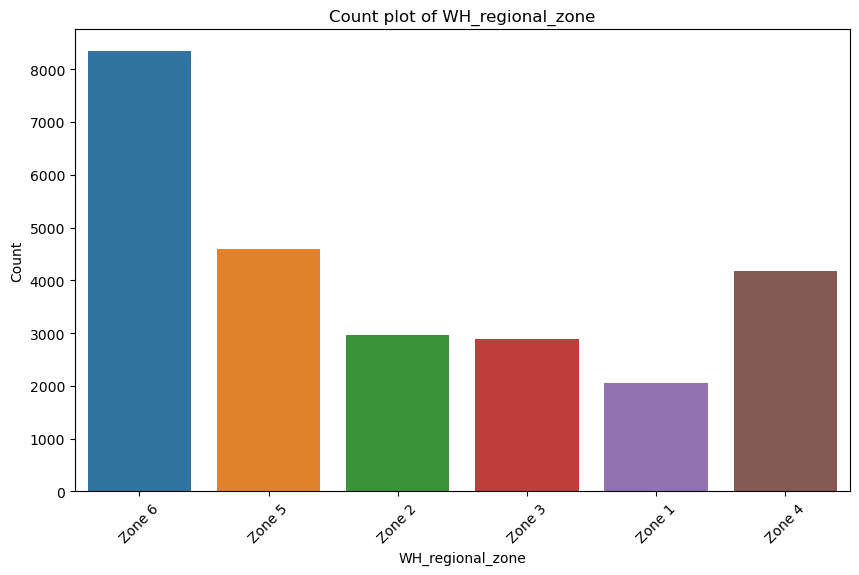

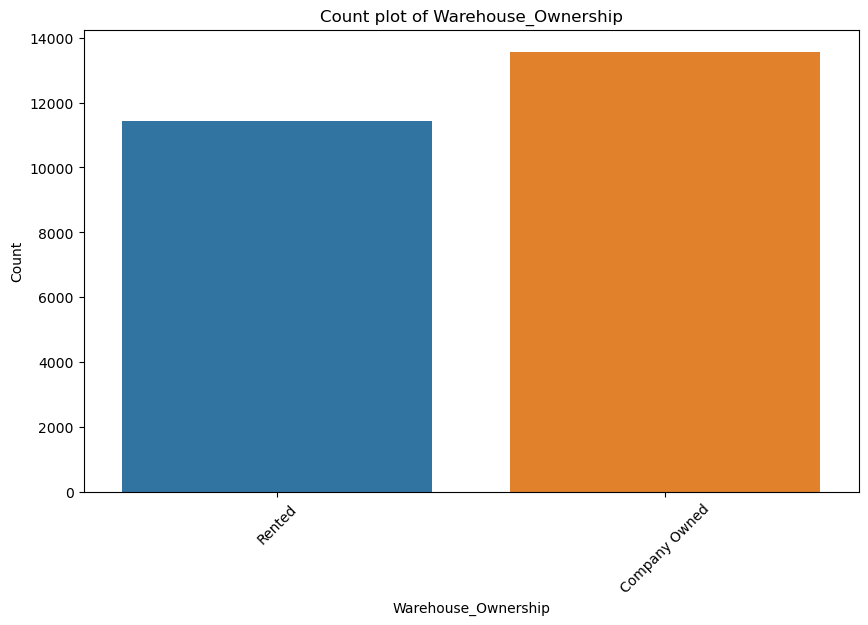

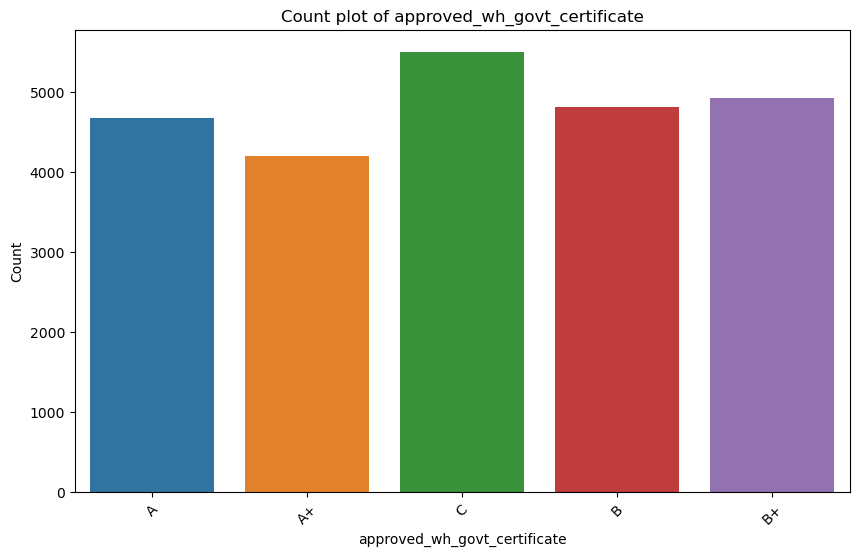

In [14]:
for col in cat:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Count plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

In [15]:
df[cat].describe().T

,count,unique,top,freq
Warehouse_ID,25000,25000,WH_100000,1
Warehouse_Manager_ID,25000,25000,EID_50000,1
Location_type,25000,2,Rural,22957
WH_capacity_size,25000,3,Large,10169
zone,25000,4,North,10278
WH_regional_zone,25000,6,Zone 6,8339
Warehouse_Ownership,25000,2,Company Owned,13578
approved_wh_govt_certificate,24092,5,C,5501


* More number of warehouses are rural warehouses could mean higher transportation costs, delays, and infrastructure constraints.
* Large and Mild capacity warehsouses are present more with a few small capacity warehouses.
* Warehouse density is high for Zone 6 while lowest is for Zone 1.
* Most warehouses are company owned.
* East have the lowest and North have the highest warehouse density.

### Bivariate analysis

In [16]:
df.columns

Index(['Warehouse_ID', 'Warehouse_Manager_ID', 'Location_type',
       'WH_capacity_size', 'zone', 'WH_regional_zone', 'num_refill_req_l3m',
       'transport_issue_l1y', 'Competitor_in_mkt', 'retail_shop_num',
       'Warehouse_Ownership', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'Product_Shipped_Tons'],
      dtype='object')

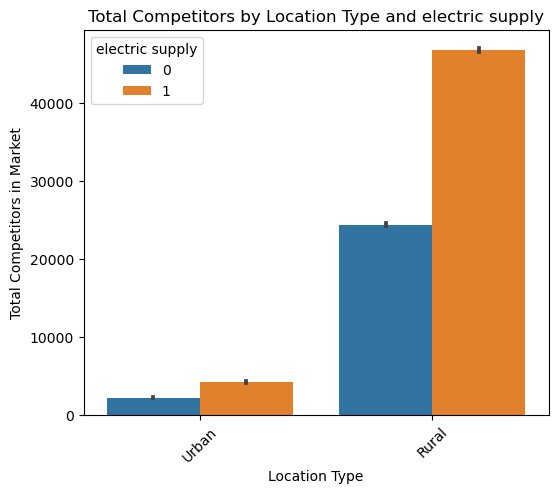

In [17]:
plt.figure(figsize=(6, 5))
sns.barplot(data=df, x='Location_type', y='Competitor_in_mkt', hue='electric_supply', estimator=sum)
plt.title('Total Competitors by Location Type and electric supply')
plt.xlabel('Location Type')
plt.ylabel('Total Competitors in Market')
plt.xticks(rotation=45)
plt.legend(title='electric supply')
plt.show()

In [18]:
df.groupby(['Location_type', 'electric_supply'])['Competitor_in_mkt'].sum().reset_index()

,Location_type,electric_supply,Competitor_in_mkt
0,Rural,0,24384
1,Rural,1,46792
2,Urban,0,2220
3,Urban,1,4209


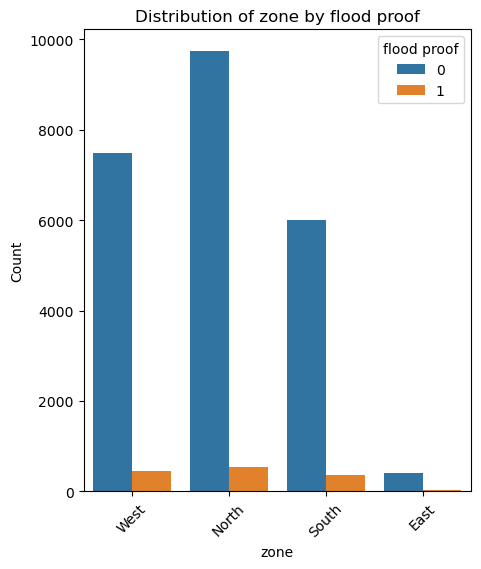

In [19]:
plt.figure(figsize=(5, 6))
sns.countplot(data=df, x='zone', hue='flood_proof')
plt.title('Distribution of zone by flood proof')
plt.xlabel('zone')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='flood proof')
plt.show()

In [20]:
df.groupby(["zone", "flood_proof"]).size().unstack(fill_value=0)

flood_proof,0,1
zone,,
East,404,25
North,9737,541
South,6009,353
West,7484,447


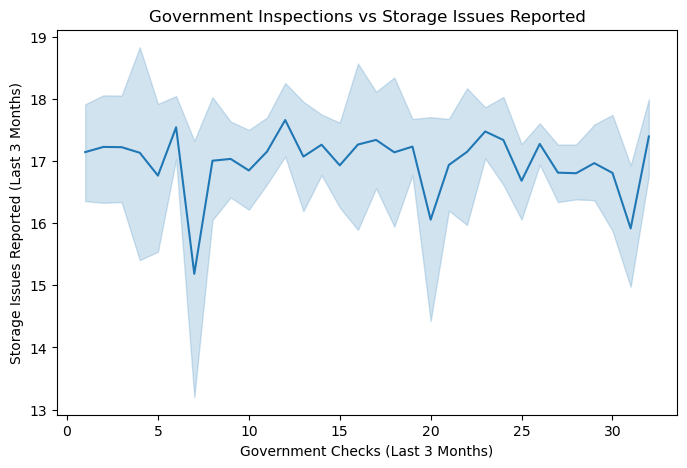

In [21]:
plt.figure(figsize=(8, 5))
sns.lineplot(data=df, x='govt_check_l3m', y='storage_issue_reported_l3m')
plt.title('Government Inspections vs Storage Issues Reported')
plt.xlabel('Government Checks (Last 3 Months)')
plt.ylabel('Storage Issues Reported (Last 3 Months)')
plt.show()

In [22]:
df.groupby('govt_check_l3m')['storage_issue_reported_l3m'].agg(['count', 'mean', 'min', 'max']).reset_index()

,govt_check_l3m,count,mean,min,max
0,1,550,17.141818,0,39
1,2,431,17.225058,0,39
2,3,438,17.221461,0,39
3,4,99,17.131313,0,39
4,5,250,16.764000,0,39
5,6,1224,17.540850,0,39
6,7,65,15.184615,0,35
7,8,276,17.003623,0,39
8,9,932,17.032189,0,39
9,10,899,16.846496,0,39


### Multivariate analysis

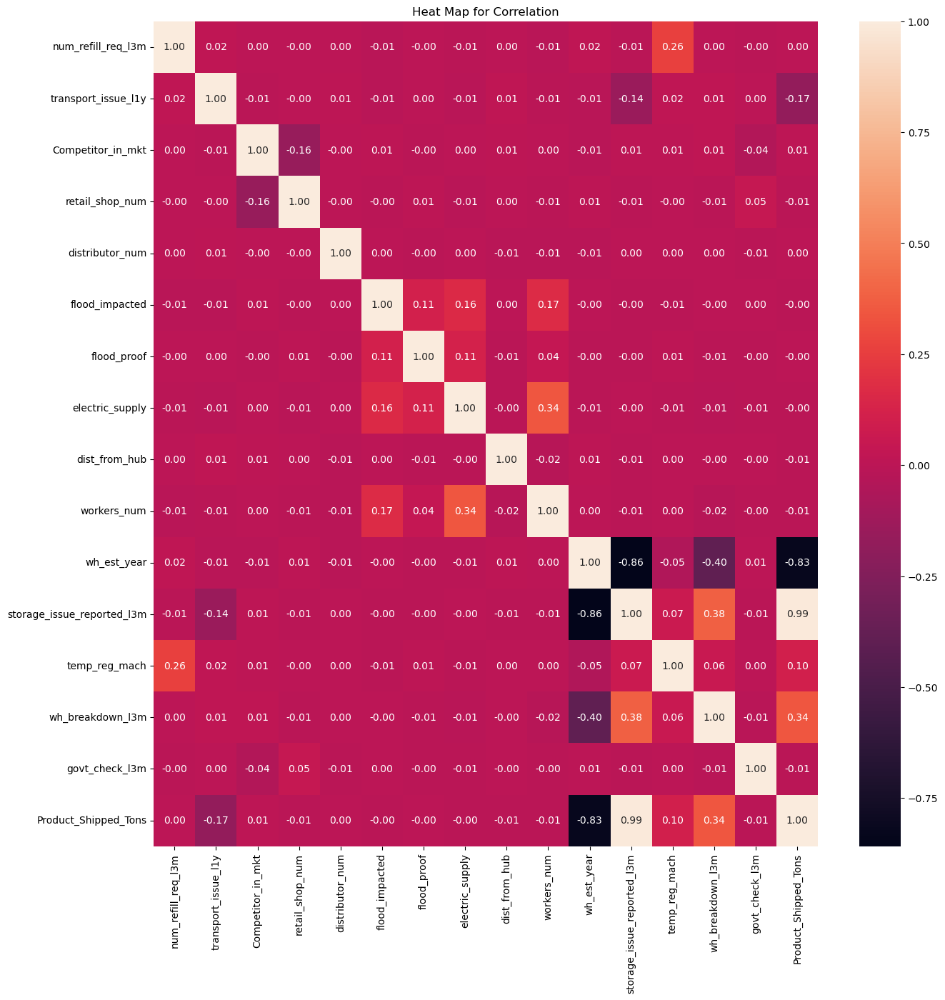

In [23]:
plt.figure(figsize=(15,15))
plt.title('Heat Map for Correlation')
sns.heatmap(df[num].corr(),annot=True,fmt=".2f");

In [24]:
corr_matrix = df[num].corr()
corr_matrix

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,Product_Shipped_Tons
num_refill_req_l3m,1.000000,0.018549,0.002985,-0.001186,0.003995,-0.010548,-0.001123,-0.007959,0.000048,-0.013764,0.015363,-0.006602,0.260928,0.000608,-0.003302,0.001415
transport_issue_l1y,0.018549,1.000000,-0.005826,-0.001826,0.008993,-0.009596,0.000022,-0.009299,0.014336,-0.009004,-0.012910,-0.144327,0.018207,0.012990,0.002190,-0.173992
Competitor_in_mkt,0.002985,-0.005826,1.000000,-0.156943,-0.001492,0.009338,-0.003444,0.001759,0.008407,0.000050,-0.011202,0.009543,0.009524,0.012733,-0.043455,0.008884
retail_shop_num,-0.001186,-0.001826,-0.156943,1.000000,-0.000395,-0.003774,0.007223,-0.009207,0.000429,-0.005406,0.005721,-0.006632,-0.001273,-0.008420,0.045749,-0.006615
distributor_num,0.003995,0.008993,-0.001492,-0.000395,1.000000,0.004611,-0.003409,0.000454,-0.011838,-0.014682,-0.012295,0.003396,0.002827,0.004286,-0.007934,0.004999
flood_impacted,-0.010548,-0.009596,0.009338,-0.003774,0.004611,1.000000,0.107015,0.164815,0.000749,0.168425,-0.000668,-0.003157,-0.008554,-0.001744,0.000587,-0.002299
flood_proof,-0.001123,0.000022,-0.003444,0.007223,-0.003409,0.107015,1.000000,0.114811,-0.005315,0.041228,-0.003329,-0.002712,0.005636,-0.005151,-0.003600,-0.000441
electric_supply,-0.007959,-0.009299,0.001759,-0.009207,0.000454,0.164815,0.114811,1.000000,-0.002701,0.339990,-0.006577,-0.001877,-0.007600,-0.010371,-0.005234,-0.002160
dist_from_hub,0.000048,0.014336,0.008407,0.000429,-0.011838,0.000749,-0.005315,-0.002701,1.000000,-0.018565,0.009226,-0.005726,0.000902,-0.000906,-0.000531,-0.005017
workers_num,-0.013764,-0.009004,0.000050,-0.005406,-0.014682,0.168425,0.041228,0.339990,-0.018565,1.000000,0.004383,-0.008673,0.001419,-0.017877,-0.003137,-0.008346


C:\ANACONDA\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


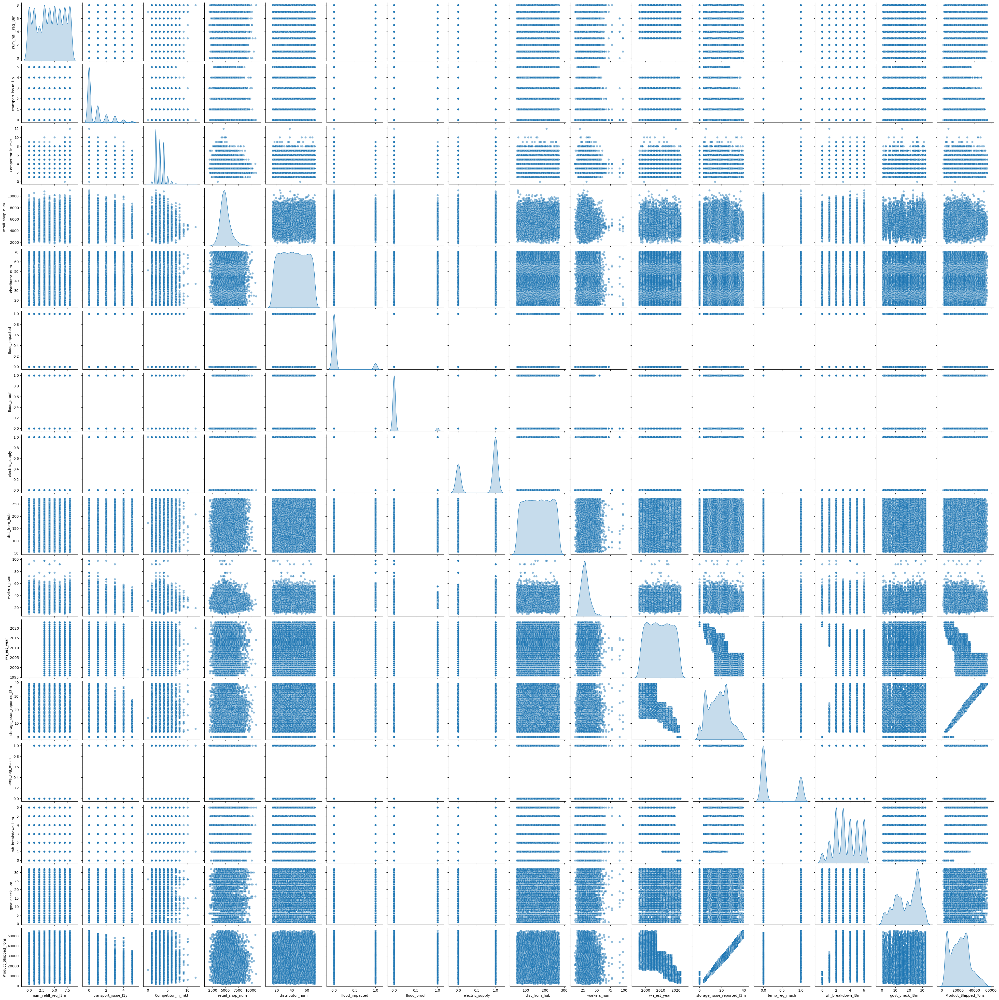

In [25]:
sns.pairplot(df[num], diag_kind='kde', plot_kws={'alpha': 0.5})
plt.show()

### Removal of Unwanted Variables

In [26]:
df.drop(columns=['Warehouse_ID', 'Warehouse_Manager_ID'], inplace=True)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Location_type                 25000 non-null  object 
 1   WH_capacity_size              25000 non-null  object 
 2   zone                          25000 non-null  object 
 3   WH_regional_zone              25000 non-null  object 
 4   num_refill_req_l3m            25000 non-null  int64  
 5   transport_issue_l1y           25000 non-null  int64  
 6   Competitor_in_mkt             25000 non-null  int64  
 7   retail_shop_num               25000 non-null  int64  
 8   Warehouse_Ownership           25000 non-null  object 
 9   distributor_num               25000 non-null  int64  
 10  flood_impacted                25000 non-null  int64  
 11  flood_proof                   25000 non-null  int64  
 12  electric_supply               25000 non-null  int64  
 13  d

### Missing Value Treatment

In [28]:
df.isnull().sum()

Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
Warehouse_Ownership                 0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
Product_Shipped_Tons                0
dtype: int64

In [29]:
print('PERCENT OF MISSING VALUES TO THE WHOLE DATA --->')
print('')
round(df.isna().sum()*100/df.shape[0], 2).sort_values(ascending=False)

PERCENT OF MISSING VALUES TO THE WHOLE DATA --->



wh_est_year                     47.52
workers_num                      3.96
approved_wh_govt_certificate     3.63
Location_type                    0.00
WH_capacity_size                 0.00
govt_check_l3m                   0.00
wh_breakdown_l3m                 0.00
temp_reg_mach                    0.00
storage_issue_reported_l3m       0.00
dist_from_hub                    0.00
electric_supply                  0.00
flood_proof                      0.00
flood_impacted                   0.00
distributor_num                  0.00
Warehouse_Ownership              0.00
retail_shop_num                  0.00
Competitor_in_mkt                0.00
transport_issue_l1y              0.00
num_refill_req_l3m               0.00
WH_regional_zone                 0.00
zone                             0.00
Product_Shipped_Tons             0.00
dtype: float64

#### Let's visually inspect the missing values in our data

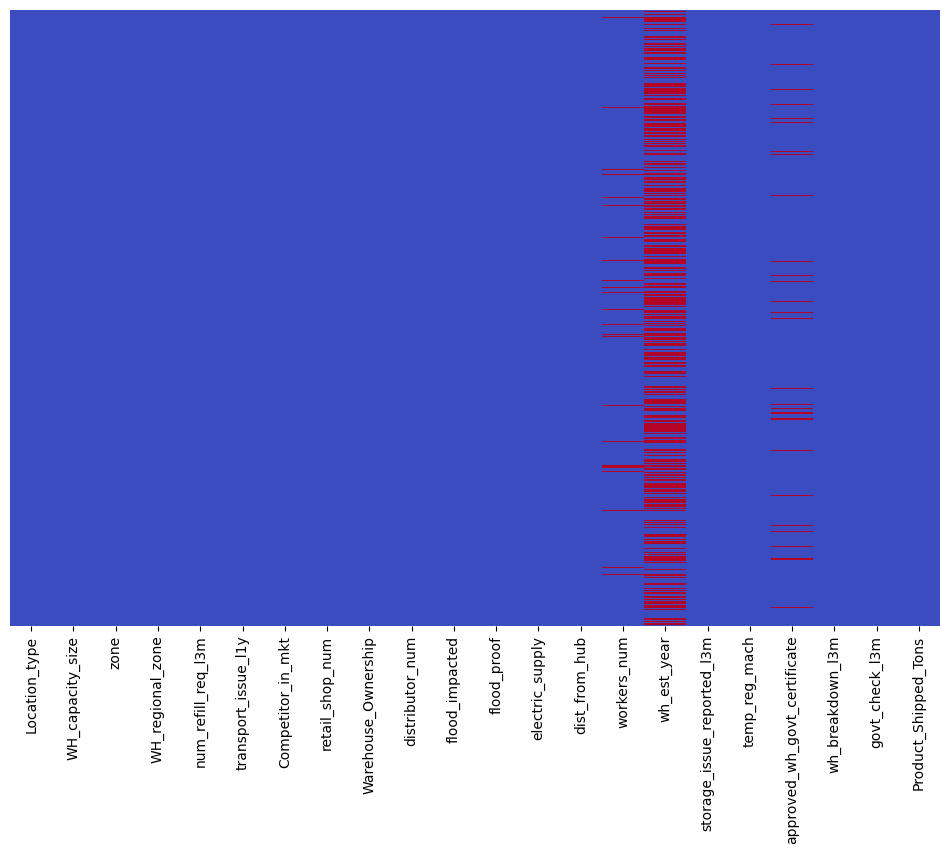

In [30]:
plt.figure(figsize = (12,8))
sns.heatmap(df.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show()

#### Dropping columns with more than 30% missing values 

In [31]:
df.drop(columns=['wh_est_year'], inplace=True)

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Location_type                 25000 non-null  object 
 1   WH_capacity_size              25000 non-null  object 
 2   zone                          25000 non-null  object 
 3   WH_regional_zone              25000 non-null  object 
 4   num_refill_req_l3m            25000 non-null  int64  
 5   transport_issue_l1y           25000 non-null  int64  
 6   Competitor_in_mkt             25000 non-null  int64  
 7   retail_shop_num               25000 non-null  int64  
 8   Warehouse_Ownership           25000 non-null  object 
 9   distributor_num               25000 non-null  int64  
 10  flood_impacted                25000 non-null  int64  
 11  flood_proof                   25000 non-null  int64  
 12  electric_supply               25000 non-null  int64  
 13  d

#### Filling missing values with median for numerical and mode for categorical(Imputation)

In [33]:
df['workers_num'].fillna(df['workers_num'].median(), inplace=True)
df['approved_wh_govt_certificate'].fillna(df['approved_wh_govt_certificate'].mode()[0], inplace=True)

In [34]:
df.isnull().sum()

Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
Warehouse_Ownership             0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
Product_Shipped_Tons            0
dtype: int64

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Location_type                 25000 non-null  object 
 1   WH_capacity_size              25000 non-null  object 
 2   zone                          25000 non-null  object 
 3   WH_regional_zone              25000 non-null  object 
 4   num_refill_req_l3m            25000 non-null  int64  
 5   transport_issue_l1y           25000 non-null  int64  
 6   Competitor_in_mkt             25000 non-null  int64  
 7   retail_shop_num               25000 non-null  int64  
 8   Warehouse_Ownership           25000 non-null  object 
 9   distributor_num               25000 non-null  int64  
 10  flood_impacted                25000 non-null  int64  
 11  flood_proof                   25000 non-null  int64  
 12  electric_supply               25000 non-null  int64  
 13  d

### Outlier Treatment:

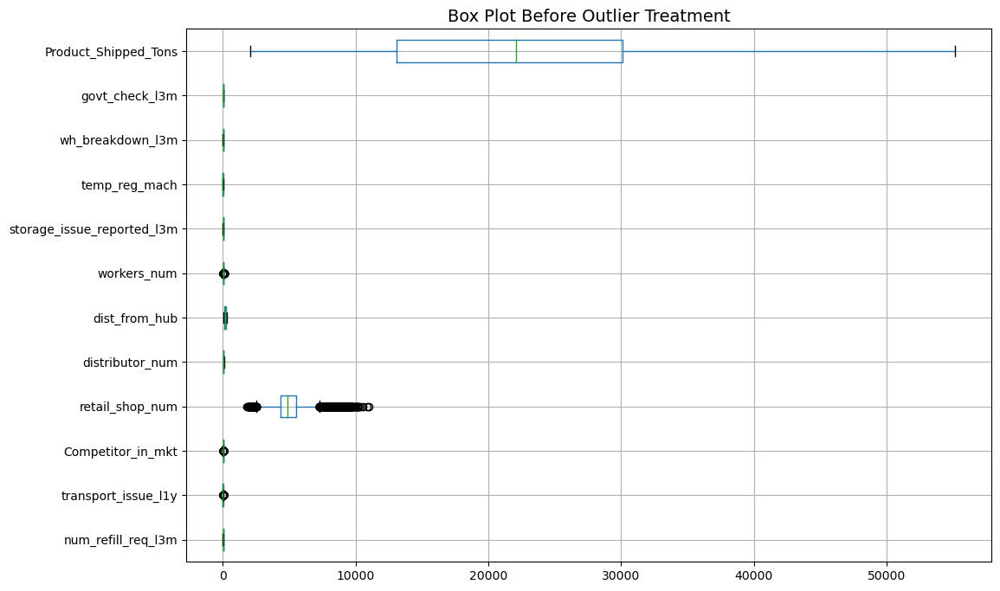

In [36]:
cont = df.select_dtypes(include=['int64', 'float64']).columns
exclude_cols = ['flood_impacted', 'electric_supply', 'flood_proof']
cont = [col for col in cont if col not in exclude_cols]

plt.figure(figsize=(12, 8))
df[cont].boxplot(vert=0)
plt.title('Box Plot Before Outlier Treatment', fontsize=14)
plt.show()

In [37]:
def remove_outlier(col):
    Q1, Q3 = np.percentile(col.dropna(), [25, 75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

In [38]:
for column in cont:
    lower_bound, upper_bound = remove_outlier(df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])

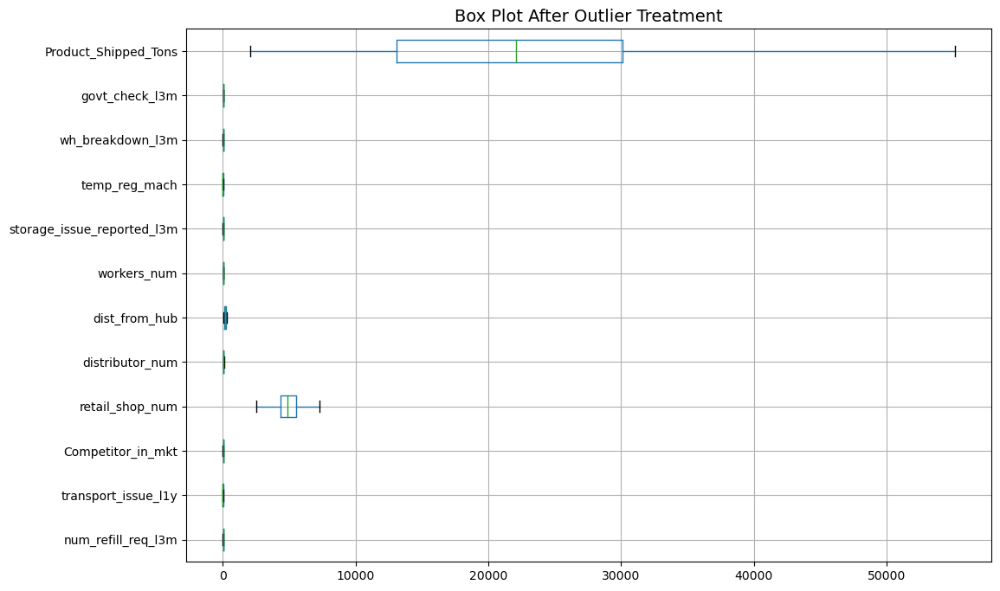

In [39]:
plt.figure(figsize=(12, 8))
df[cont].boxplot(vert=0)
plt.title('Box Plot After Outlier Treatment', fontsize=14)
plt.show()

In [40]:
df.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,Warehouse_Ownership,distributor_num,...,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,Product_Shipped_Tons
0,Urban,Small,West,Zone 6,3.0,1.0,2.0,4651.0,Rented,24.0,...,1,1,91.0,29.0,13.0,0.0,A,5.0,15.0,17115.0
1,Rural,Large,North,Zone 5,0.0,0.0,4.0,6217.0,Company Owned,47.0,...,0,1,210.0,31.0,4.0,0.0,A,3.0,17.0,5074.0
2,Rural,Mid,South,Zone 2,1.0,0.0,4.0,4306.0,Company Owned,64.0,...,0,0,161.0,37.0,17.0,0.0,A,6.0,22.0,23137.0
3,Rural,Mid,North,Zone 3,7.0,2.5,2.0,6000.0,Rented,50.0,...,0,0,103.0,21.0,17.0,1.0,A+,3.0,27.0,22115.0
4,Rural,Large,North,Zone 5,3.0,1.0,2.0,4740.0,Company Owned,42.0,...,0,1,112.0,25.0,18.0,0.0,C,6.0,24.0,24071.0


In [41]:
df1=df.copy()

In [42]:
from sklearn.preprocessing import StandardScaler

In [43]:
scaler = StandardScaler()
df1[cont] = scaler.fit_transform(df1[cont])

# Checking transformed values
df1[cont].head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,Product_Shipped_Tons
0,-0.417807,0.374779,-0.980772,-0.317618,-1.146546,-1.156575,0.036913,-0.450876,-0.659770,0.898041,-0.441634,-0.429690
1,-1.568750,-0.714377,0.803748,1.297843,0.285226,0.740827,0.317090,-1.433309,-0.659770,-0.285180,-0.209944,-1.467034
2,-1.185102,-0.714377,0.803748,-0.673514,1.343493,-0.040456,1.157622,-0.014239,-0.659770,1.489652,0.369282,0.089112
3,1.116783,2.008512,-0.980772,1.073989,0.471979,-0.965240,-1.083795,-0.014239,1.515679,-0.285180,0.948508,0.001065
4,-0.417807,0.374779,-0.980772,-0.225807,-0.026028,-0.821739,-0.523441,0.094921,-0.659770,1.489652,0.600972,0.169577


In [44]:
df1 = pd.get_dummies(df1, 
                     columns=['zone', 'WH_regional_zone', 'Warehouse_Ownership', 
                              'Location_type', 'WH_capacity_size', 'approved_wh_govt_certificate'], 
                     drop_first=True)

# Convert only categorical (one-hot encoded) columns from bool to int8
cat_cols = df1.select_dtypes(include=['bool']).columns  # Identify boolean columns
df1[cat_cols] = df1[cat_cols].astype('int8')  # Convert to int8

# Check data types
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   num_refill_req_l3m               25000 non-null  float64
 1   transport_issue_l1y              25000 non-null  float64
 2   Competitor_in_mkt                25000 non-null  float64
 3   retail_shop_num                  25000 non-null  float64
 4   distributor_num                  25000 non-null  float64
 5   flood_impacted                   25000 non-null  int64  
 6   flood_proof                      25000 non-null  int64  
 7   electric_supply                  25000 non-null  int64  
 8   dist_from_hub                    25000 non-null  float64
 9   workers_num                      25000 non-null  float64
 10  storage_issue_reported_l3m       25000 non-null  float64
 11  temp_reg_mach                    25000 non-null  float64
 12  wh_breakdown_l3m  

In [45]:
df1.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,Warehouse_Ownership_Rented,Location_type_Urban,WH_capacity_size_Mid,WH_capacity_size_Small,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,-0.417807,0.374779,-0.980772,-0.317618,-1.146546,0,1,1,-1.156575,0.036913,...,0,1,1,1,0,1,0,0,0,0
1,-1.568750,-0.714377,0.803748,1.297843,0.285226,0,0,1,0.740827,0.317090,...,1,0,0,0,0,0,0,0,0,0
2,-1.185102,-0.714377,0.803748,-0.673514,1.343493,0,0,0,-0.040456,1.157622,...,0,0,0,0,1,0,0,0,0,0
3,1.116783,2.008512,-0.980772,1.073989,0.471979,0,0,0,-0.965240,-1.083795,...,0,0,1,0,1,0,1,0,0,0
4,-0.417807,0.374779,-0.980772,-0.225807,-0.026028,1,0,1,-0.821739,-0.523441,...,1,0,0,0,0,0,0,0,0,1


In [46]:
df1.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,Warehouse_Ownership_Rented,Location_type_Urban,WH_capacity_size_Mid,WH_capacity_size_Small,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,-0.417807,0.374779,-0.980772,-0.317618,-1.146546,0,1,1,-1.156575,0.036913,...,0,1,1,1,0,1,0,0,0,0
1,-1.568750,-0.714377,0.803748,1.297843,0.285226,0,0,1,0.740827,0.317090,...,1,0,0,0,0,0,0,0,0,0
2,-1.185102,-0.714377,0.803748,-0.673514,1.343493,0,0,0,-0.040456,1.157622,...,0,0,0,0,1,0,0,0,0,0
3,1.116783,2.008512,-0.980772,1.073989,0.471979,0,0,0,-0.965240,-1.083795,...,0,0,1,0,1,0,1,0,0,0
4,-0.417807,0.374779,-0.980772,-0.225807,-0.026028,1,0,1,-0.821739,-0.523441,...,1,0,0,0,0,0,0,0,0,1


### Forming 2 Clusters with K=2

In [47]:
# Create K Means cluster and store the result in the object k_means
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters = 2,random_state=1)

In [48]:
k_means.fit(df1)

KMeans(n_clusters=2, random_state=1)

In [49]:
k_means.n_clusters

2

In [50]:
k_means.inertia_

339070.27042857674

### Cluster Output for all the observations

In [51]:
# Get the labels
k_means.labels_

array([1, 1, 0, ..., 0, 0, 1])

### Within Cluster Sum of Squares

In [52]:
round(k_means.inertia_,2)

339070.27

### Calculating WSS

In [53]:
wss =[]
for i in range(1,11):
    KM = KMeans(n_clusters=i,random_state=1)
    KM.fit(df1)
    wss.append(round(KM.inertia_,2))

In [54]:
wss

[377350.59,
 339070.27,
 320335.77,
 310544.15,
 299886.48,
 292638.47,
 286559.84,
 281854.4,
 277877.13,
 273392.76]

### Plot the elbow graph

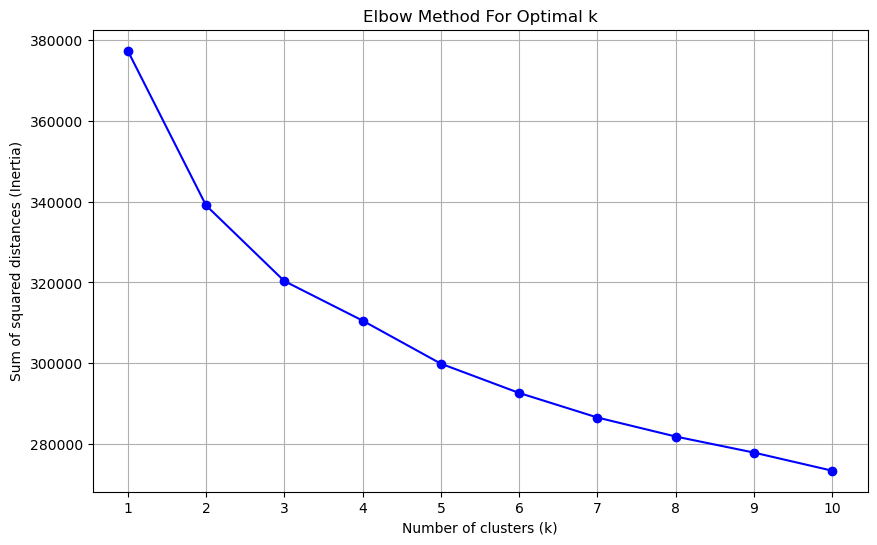

In [55]:
a=[1,2,3,4,5,6,7,8,9,10]
# Plot the elbow graph
plt.figure(figsize=(10, 6))
plt.plot(a,wss,'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of squared distances (Inertia)')
plt.title('Elbow Method For Optimal k')
plt.xticks(np.arange(1, 11, step=1))
plt.grid(True)
plt.show()

## Silhouette Scores

In [56]:
# Silhouette Analysis
from sklearn.metrics import silhouette_score
range_n_clusters=[2,3,4,5,6,7,8,9,10]
for num_clusters in range_n_clusters:
    
    # initialize K means
    kmeans=KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(df1)
    cluster_labels=kmeans.labels_
    #Silhouette Score
    silhouette_avg = silhouette_score(df1,cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.09505969931239644
For n_clusters=3, the silhouette score is 0.07222366310946553
For n_clusters=4, the silhouette score is 0.07980713149851
For n_clusters=5, the silhouette score is 0.06747338335115946
For n_clusters=6, the silhouette score is 0.06876639914226937
For n_clusters=7, the silhouette score is 0.059039000576616554
For n_clusters=8, the silhouette score is 0.05998591473602823
For n_clusters=9, the silhouette score is 0.0537286445858407
For n_clusters=10, the silhouette score is 0.05731759576241866


In [57]:
k = 3  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=1)
kmeans.fit(df1)
Clus_kmeans3 = kmeans.labels_

In [58]:
df1['Clus_kmeans3'] = Clus_kmeans3

In [59]:
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df1['Cluster'] = kmeans.fit_predict(df1)

In [60]:
cluster_summary = df1.groupby('Cluster')[cont].mean()
cluster_summary

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,Product_Shipped_Tons
Cluster,,,,,,,,,,,,
0,0.411549,-0.035555,0.021976,-0.004401,-0.002811,-0.003917,-0.003314,0.418670,1.515679,0.296229,0.005594,0.482693
1,-0.204131,-0.166098,0.008948,-0.011324,0.005198,-0.016483,-0.008428,0.614227,-0.659770,0.377791,-0.019120,0.564107
2,-0.044131,0.230544,-0.026850,0.017139,-0.004393,0.023158,0.012785,-1.059125,-0.276079,-0.679284,0.019571,-1.043329


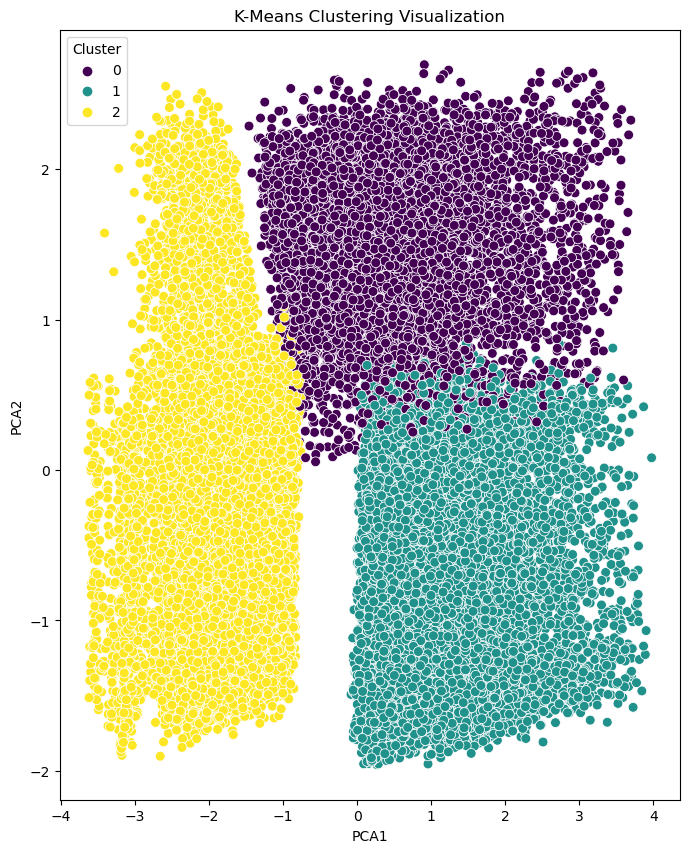

In [61]:
from sklearn.decomposition import PCA
import seaborn as sns

features = df1.drop(columns=['Cluster'])  
pca = PCA(n_components=2)
df_pca = pca.fit_transform(features)  


df_pca = pd.DataFrame(df_pca, columns=['PCA1', 'PCA2'])
df_pca['Cluster'] = df1['Cluster']  


plt.figure(figsize=(8, 10))
sns.scatterplot(x=df_pca['PCA1'], y=df_pca['PCA2'], hue=df_pca['Cluster'], palette='viridis', s=50)
plt.title('K-Means Clustering Visualization')
plt.show()

### Encode the data

In [62]:
cat = df.select_dtypes(include=['object']).columns #Categorical Variables
df_encoded =pd.get_dummies(df, columns=cat,dtype='int8',drop_first=True)

In [63]:
df_encoded.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 2,WH_regional_zone_Zone 3,WH_regional_zone_Zone 4,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,Warehouse_Ownership_Rented,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,3.0,1.0,2.0,4651.0,24.0,0,1,1,91.0,29.0,...,0,0,0,0,1,1,0,0,0,0
1,0.0,0.0,4.0,6217.0,47.0,0,0,1,210.0,31.0,...,0,0,0,1,0,0,0,0,0,0
2,1.0,0.0,4.0,4306.0,64.0,0,0,0,161.0,37.0,...,1,0,0,0,0,0,0,0,0,0
3,7.0,2.5,2.0,6000.0,50.0,0,0,0,103.0,21.0,...,0,1,0,0,0,1,1,0,0,0
4,3.0,1.0,2.0,4740.0,42.0,1,0,1,112.0,25.0,...,0,0,0,1,0,0,0,0,0,1


### Scale the data

**scaling is important for algorithms that rely on distance measurements or that are sensitive to the scale of features, while its impact is less critical for algorithms that are not affected by the scale of the features.**

In [64]:
num = df.select_dtypes(include=['int64', 'float64','int8']).columns #Numerical_columns
print(num)

Index(['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'distributor_num', 'flood_impacted', 'flood_proof',
       'electric_supply', 'dist_from_hub', 'workers_num',
       'storage_issue_reported_l3m', 'temp_reg_mach', 'wh_breakdown_l3m',
       'govt_check_l3m', 'Product_Shipped_Tons'],
      dtype='object')


In [65]:
df_encoded[num] = df_encoded[num].apply(lambda x:(x-x.min()) / (x.max()-x.min()))

**We are using using min-max technique**

In [66]:
df_encoded.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 2,WH_regional_zone_Zone 3,WH_regional_zone_Zone 4,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,Warehouse_Ownership_Rented,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,0.375,0.4,0.285714,0.446188,0.163636,0.0,1.0,1.0,0.166667,0.513889,...,0,0,0,0,1,1,0,0,0,0
1,0.000,0.0,0.571429,0.776011,0.581818,0.0,0.0,1.0,0.717593,0.569444,...,0,0,0,1,0,0,0,0,0,0
2,0.125,0.0,0.571429,0.373526,0.890909,0.0,0.0,0.0,0.490741,0.736111,...,1,0,0,0,0,0,0,0,0,0
3,0.875,1.0,0.285714,0.730307,0.636364,0.0,0.0,0.0,0.222222,0.291667,...,0,1,0,0,0,1,1,0,0,0
4,0.375,0.4,0.285714,0.464933,0.490909,1.0,0.0,1.0,0.263889,0.402778,...,0,0,0,1,0,0,0,0,0,1


### Data split

In [67]:
df_encoded.columns

Index(['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'distributor_num', 'flood_impacted', 'flood_proof',
       'electric_supply', 'dist_from_hub', 'workers_num',
       'storage_issue_reported_l3m', 'temp_reg_mach', 'wh_breakdown_l3m',
       'govt_check_l3m', 'Product_Shipped_Tons', 'Location_type_Urban',
       'WH_capacity_size_Mid', 'WH_capacity_size_Small', 'zone_North',
       'zone_South', 'zone_West', 'WH_regional_zone_Zone 2',
       'WH_regional_zone_Zone 3', 'WH_regional_zone_Zone 4',
       'WH_regional_zone_Zone 5', 'WH_regional_zone_Zone 6',
       'Warehouse_Ownership_Rented', 'approved_wh_govt_certificate_A+',
       'approved_wh_govt_certificate_B', 'approved_wh_govt_certificate_B+',
       'approved_wh_govt_certificate_C'],
      dtype='object')

In [68]:
# Copy all the predictor variables into X dataframe
X = df_encoded.drop('Product_Shipped_Tons', axis=1)

# Copy target into the y dataframe.  
y = df_encoded['Product_Shipped_Tons']

In [69]:
X.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 2,WH_regional_zone_Zone 3,WH_regional_zone_Zone 4,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,Warehouse_Ownership_Rented,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,0.375,0.4,0.285714,0.446188,0.163636,0.0,1.0,1.0,0.166667,0.513889,...,0,0,0,0,1,1,0,0,0,0
1,0.000,0.0,0.571429,0.776011,0.581818,0.0,0.0,1.0,0.717593,0.569444,...,0,0,0,1,0,0,0,0,0,0
2,0.125,0.0,0.571429,0.373526,0.890909,0.0,0.0,0.0,0.490741,0.736111,...,1,0,0,0,0,0,0,0,0,0
3,0.875,1.0,0.285714,0.730307,0.636364,0.0,0.0,0.0,0.222222,0.291667,...,0,1,0,0,0,1,1,0,0,0
4,0.375,0.4,0.285714,0.464933,0.490909,1.0,0.0,1.0,0.263889,0.402778,...,0,0,0,1,0,0,0,0,0,1


In [70]:
y.head()

0    0.283502
1    0.056682
2    0.396941
3    0.377689
4    0.414535
Name: Product_Shipped_Tons, dtype: float64

In [71]:
# Split X and y into training and test set in 75:25 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25 , random_state=1)

## Model Building

## Linear Regression

In [72]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [73]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [74]:
y_pred_lin = lin_reg.predict(X_test)

In [75]:
mae_lin = mean_absolute_error(y_test, y_pred_lin)
rmse_lin = np.sqrt(mean_squared_error(y_test, y_pred_lin))
r2_lin = r2_score(y_test, y_pred_lin)

In [76]:
results_lin = {"MAE": mae_lin, "RMSE": rmse_lin, "R² Score": r2_lin}
print("Linear Regression Results:")
print(pd.DataFrame([results_lin]))

Linear Regression Results:
        MAE      RMSE  R² Score
0  0.018673  0.025196  0.986485


## Decision Tree

In [77]:
from sklearn.tree import DecisionTreeRegressor

In [78]:
dt_reg = DecisionTreeRegressor(random_state=42)
dt_reg.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [79]:
y_pred_dt = dt_reg.predict(X_test)

In [80]:
mae_dt = mean_absolute_error(y_test, y_pred_dt)
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))
r2_dt = r2_score(y_test, y_pred_dt)

In [81]:
results_dt = {"MAE": mae_dt, "RMSE": rmse_dt, "R² Score": r2_dt}
print("Decision Tree Regression Results:")
print(pd.DataFrame([results_dt]))

Decision Tree Regression Results:
       MAE      RMSE  R² Score
0  0.01648  0.024487  0.987236


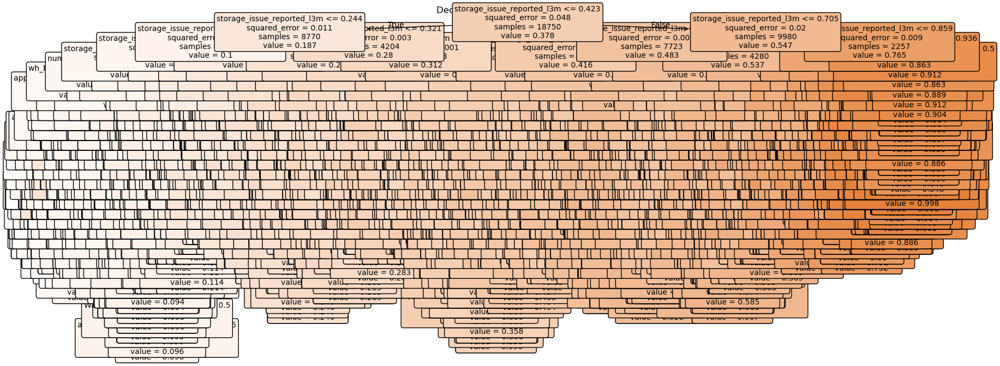

In [82]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt


plt.figure(figsize=(20, 8))


plot_tree(dt_reg, feature_names=X_train.columns, filled=True, rounded=True, fontsize=10)


plt.title("Decision Tree Visualization")
plt.show()

## Random Forest

In [83]:
from sklearn.ensemble import RandomForestRegressor

In [84]:
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [85]:
y_pred_rf = rf_reg.predict(X_test)

In [86]:
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

In [87]:
results_rf = {"MAE": mae_rf, "RMSE": rmse_rf, "R² Score": r2_rf}
print("Random Forest Regression Results:")
print(pd.DataFrame([results_rf]))

Random Forest Regression Results:
        MAE      RMSE  R² Score
0  0.013174  0.017566  0.993431


## Gradient Boosting

In [88]:
from sklearn.ensemble import GradientBoostingRegressor

In [89]:
gb_reg = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_reg.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [90]:
y_pred_gb = gb_reg.predict(X_test)

In [91]:
mae_gb = mean_absolute_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mean_squared_error(y_test, y_pred_gb))
r2_gb = r2_score(y_test, y_pred_gb)

In [92]:
results_gb = {"MAE": mae_gb, "RMSE": rmse_gb, "R² Score": r2_gb}
print("Gradient Boosting Regression Results:")
print(pd.DataFrame([results_gb]))

Gradient Boosting Regression Results:
        MAE      RMSE  R² Score
0  0.012956  0.017047  0.993814


## AdaBoost

In [93]:
from sklearn.ensemble import AdaBoostRegressor

In [94]:
ada_reg = AdaBoostRegressor(n_estimators=100, random_state=42)
ada_reg.fit(X_train, y_train)

AdaBoostRegressor(n_estimators=100, random_state=42)

In [95]:
y_pred_ada = ada_reg.predict(X_test)

In [96]:
mae_ada = mean_absolute_error(y_test, y_pred_ada)
rmse_ada = np.sqrt(mean_squared_error(y_test, y_pred_ada))
r2_ada = r2_score(y_test, y_pred_ada)

In [97]:
results_ada = {"MAE": mae_ada, "RMSE": rmse_ada, "R² Score": r2_ada}
print("AdaBoost Regression Results:")
print(pd.DataFrame([results_ada]))

AdaBoost Regression Results:
        MAE      RMSE  R² Score
0  0.026028  0.032538  0.977462


## Model Tuning

### Hyperparameter Tuning Using GridSearchCV

#### Gradient Boosting Tuning

In [98]:
from sklearn.model_selection import GridSearchCV

In [99]:
param_grid_gb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

In [100]:
grid_search_gb = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gb, cv=5, scoring='r2')
grid_search_gb.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(random_state=42),
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='r2')

In [101]:
print("Best parameters for Gradient Boosting:", grid_search_gb.best_params_)

Best parameters for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


In [102]:
best_gb_model = grid_search_gb.best_estimator_

In [103]:
best_gb_model

GradientBoostingRegressor(max_depth=5, random_state=42)

#### Random Forest Tuning

In [104]:
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10]
}

In [105]:
grid_search_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, scoring='r2')
grid_search_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
             param_grid={'max_depth': [10, 20, None],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             scoring='r2')

In [106]:
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
best_rf_model = grid_search_rf.best_estimator_

Best parameters for Random Forest: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200}


#### AdaBoost Tuning

In [107]:
param_grid_ab = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 1.0]
}

In [108]:
grid_search_ab = GridSearchCV(AdaBoostRegressor(random_state=42), param_grid_ab, cv=5, scoring='r2')
grid_search_ab.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=AdaBoostRegressor(random_state=42),
             param_grid={'learning_rate': [0.01, 0.1, 1.0],
                         'n_estimators': [50, 100, 150]},
             scoring='r2')

In [109]:
print("Best parameters for AdaBoost:", grid_search_ab.best_params_)
best_ab_model = grid_search_ab.best_estimator_

Best parameters for AdaBoost: {'learning_rate': 0.1, 'n_estimators': 100}


In [110]:
tuned_models = {
    "Tuned Random Forest": best_rf_model,
    "Tuned Gradient Boosting": best_gb_model,
    "Tuned AdaBoost": best_ab_model
}

In [111]:
tuned_results = {}

In [112]:
for name, model in tuned_models.items():
    y_pred = model.predict(X_test)  # Predict on test data

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    tuned_results[name] = {"MAE": mae, "RMSE": rmse, "R² Score": r2}

In [113]:
tuned_results_df = pd.DataFrame(tuned_results).T
print(tuned_results_df)

                              MAE      RMSE  R² Score
Tuned Random Forest      0.012772  0.016985  0.993859
Tuned Gradient Boosting  0.012571  0.016687  0.994072
Tuned AdaBoost           0.024818  0.031345  0.979085


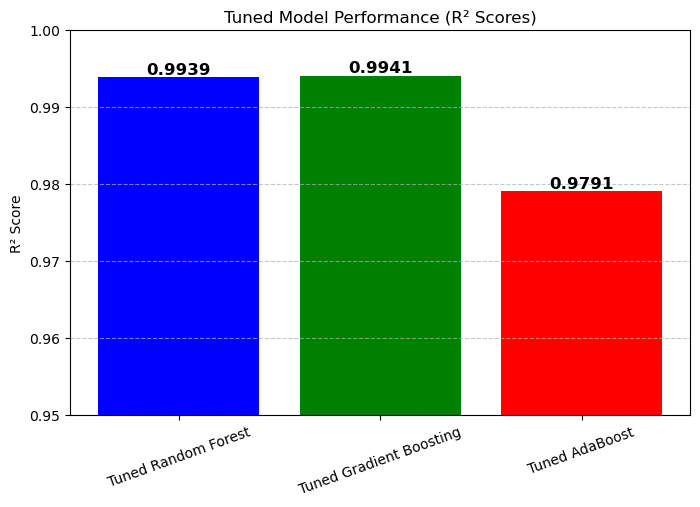

In [114]:
models = ["Tuned Random Forest", "Tuned Gradient Boosting", "Tuned AdaBoost"]
r2_scores = [0.9939, 0.9941, 0.9791]


plt.figure(figsize=(8, 5))
bars = plt.bar(models, r2_scores, color=['blue', 'green', 'red'])

for bar, score in zip(bars, r2_scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{score:.4f}", 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

# Formatting the plot
plt.ylim(0.95, 1.0)
plt.ylabel("R² Score")
plt.title("Tuned Model Performance (R² Scores)")
plt.xticks(rotation=20)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


<Figure size 1200x600 with 0 Axes>

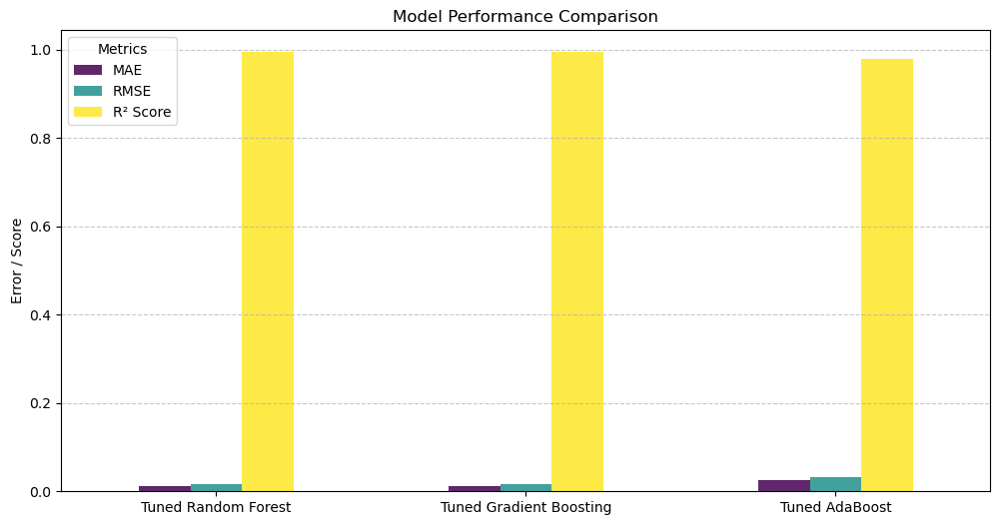

In [115]:
tuned_results = {
    "Tuned Random Forest": {"MAE": 0.012772, "RMSE": 0.016985, "R² Score": 0.993859},
    "Tuned Gradient Boosting": {"MAE": 0.012571, "RMSE": 0.016687, "R² Score": 0.994072},
    "Tuned AdaBoost": {"MAE": 0.024818, "RMSE": 0.031345, "R² Score": 0.979085}
}

tuned_results_df = pd.DataFrame(tuned_results).T

plt.figure(figsize=(12, 6))
tuned_results_df[['MAE', 'RMSE', 'R² Score']].plot(kind='bar', figsize=(12, 6), colormap="viridis", alpha=0.85)
plt.title("Model Performance Comparison")
plt.ylabel("Error / Score")
plt.xticks(rotation=0)
plt.legend(title="Metrics")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()